# Исследование рынка заведений общественного питания Москвы.



Заказчики - инвесторы из фонда «Shut Up and Take My Money» запросили провести исследование рынка Москвы, найти интересные особенности, которые в будущем помогут в выборе подходящего инвесторам места для открытия заведения общественного питания в Москве.

План исследования:
1. [Ознакомление с данными](#start)
    - [Изучение общей информации о датасете](#1.1)
2. [Предобработка данных](#preprocessing) 
    - [Поиск дубликатов](#2.1)
    - [Работа с пропусками](#2.2)
    - [Создание столбца street с названиями улиц из столбца с адресом](#2.3)
    - [Создание столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)3](#2.4)
3. [Анализ данных](#analitic)
   - [Какие категории заведений представлены в данных?](#3.1) 
   - [Исследуем количество посадочных мест в местах по категориям](#3.2)
   - [Исследуем соотношение сетевых и несетевых заведений в датасете](#3.3)
   - [Какие категории заведений чаще являются сетевыми?](#3.4)
   - [Найдем топ-15 популярных сетей в Москве](#3.5)
   - [Исследование административных районов Москвы](#3.6) 
   - [Визуализация распределения средних рейтингов по категориям заведений](#3.7)
   - [Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района](#3.8)
   - [Отображение всех заведений датасета на карте](#3.9)
   - [Топ-15 улиц по количеству заведений](#3.10)
   - [Улицы, на которых находится только один объект общепита](#3.11)
   - [Фоновая картограмма медианной суммы заказа по административным округам Москвы](#3.12)     
4. [Вывод](#conclusion)  
5. [Детализация исследования: открытие кофейни](#detailing)
   - [Исследуем кофейни в датасете](#5.1)
   - [Исследуем круглосуточные кофейни](#5.2)
   - [Исследуем рейтинг кофейн](#5.3)
   - [Исследуем среднюю стоимость чашки капучино в кофейнях](#5.4)
   - [Рекомендации](#5.5)



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
#from scipy import stats as st
#from IPython.display import display_html
#from plotly import graph_objects as go 
#pd.set_option('display.max_columns', 30)
pd.set_option('display.max_columns', 500)
pd.set_option('display.float_format', '{:,.2f}'.format)
plt.style.use('seaborn-pastel')
#import warnings
#warnings.simplefilter('ignore')
sns.set_palette('pastel') 
import folium
pd.set_option('display.max_rows', 500)

C:\Users\fedos\practicum\practicum_env\lib\site-packages\scipy\__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


<a id="start"></a>
## Ознакомление с данными


Изучение общей информации о датасете
<a id="1.1"></a>

In [2]:
path = 'C:/Users/fedos/practicum/'
df = pd.read_csv(path + 'moscow_places.csv') # загрузим наши данные


In [3]:
display(df.head(15))
display(df.info())


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,0,45.00
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.89,37.52,4.70,средние,Средний счёт:200–300 ₽,250.00,NaN,0,45.00
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,0,79.00
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.88,37.52,4.30,средние,Средний счёт:1000–1200 ₽,"1,100.00",NaN,0,65.00


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

Мы видим, что у нас 8406 строк данных, 14 столбцов. Проверим есть ли в данных явные дубликаты

## Предобработка данных
<a id="preprocessing"></a> 

Перед началом предобработки зафиксируем форму нашего датафрейма, чтобы после обработки оценить результаты.

In [4]:
shape = df.shape
print('DataFrame Shape :', shape)
print('Number of rows :', shape[0])
print('Number of columns :', shape[1])

DataFrame Shape : (8406, 14)
Number of rows : 8406
Number of columns : 14


### Поиск дубликатов
<a id="2.1"></a> 

In [5]:
df.duplicated().sum()

0

Явных дубликатов нет.

Проверим есть ли у нас неявные дубликаты. Сначала посмотрим на начальное количетсво уникальных значений столбцов и приведем столбцы name и address к нижнему регистру и заменим ё на е, й на и.

In [6]:
df['address'].nunique()

5753

In [7]:
df['name'].nunique()

5614

In [8]:
df['name'] = df['name'].str.lower()
df['address'] = df['address'].str.lower()
df['name'] = df['name'].str.replace('ё', 'е')
df['name'] = df['name'].str.replace('й', 'и')
df['address'] = df['address'].str.replace('ё', 'е')
df['address'] = df['address'].str.replace('й', 'и')

In [9]:

df['address'].nunique()

5752

In [10]:
df['name'].nunique()

5506

Ушел один дубликат из address и 108 дубликата из name. Теперь поищем дубликаты вручную и удалим найденные.

In [11]:
df.duplicated(subset=['name', 'address']).sum()


4

In [12]:
print(len(df))
df = df.drop_duplicates(subset=['name', 'address'])
print(len(df))

8406
8402


Работа над дубликатами проведена.

### Работа с пропусками
<a id="2.2"></a> 

In [13]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Мы видим, что у нас много пропусков в столбцах с часами работы заведений, категории цен, данных по средним чекам и посадочным местам. Заполнять эти пропуски какими-то средними/медианными значениями некорректно, это будут недостоверные данные и они повлияют на результаты исследования. Оставим пропуски как есть.

### Создадим столбец street с названиями улиц из столбца с адресом. Посмотрим на значения столбца address. 
<a id="2.3"></a> 

In [14]:
df['address'].unique()

array(['москва, улица дыбенко, 7/1', 'москва, улица дыбенко, 36, корп. 1',
       'москва, клязьминская улица, 15', ...,
       'москва, улица лобачевского, 52, корп. 1',
       'москва, болотниковская улица, 52, корп. 2',
       'москва, чонгарскии бульвар, 26а, корп. 1'], dtype=object)

Данные в нем выглядят прилично, первым указан город, затем улица, чтобы выделить столбей с улицей воспользуемся функцией split.

In [15]:
df['street'] = df['address'].str.split(', ').str[1]

In [16]:
#Код ревьюера
df.query('street == "проспект мира"').head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
718,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.84,37.61,4.40,выше среднего,Средний счёт:от 1500 ₽,"1,500.00",NaN,0,NaN,проспект мира
786,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.84,37.62,4.10,средние,Средний счёт:900–1100 ₽,"1,000.00",NaN,0,NaN,проспект мира
792,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.84,37.61,4.20,NaN,NaN,NaN,NaN,0,NaN,проспект мира
800,пян-се,быстрое питание,"москва, проспект мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.83,37.61,4.40,NaN,NaN,NaN,NaN,1,NaN,проспект мира
909,космос,кафе,"москва, проспект мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.84,37.62,3.80,NaN,NaN,NaN,NaN,0,NaN,проспект мира
910,оттепель,ресторан,"москва, проспект мира, 119, стр. 311",Северо-Восточный административный округ,пн-ср 11:00–22:00; чт-сб 11:00–23:00; вс 11:00...,55.83,37.62,4.70,высокие,Средний счёт:2500–3000 ₽,"2,750.00",NaN,0,NaN,проспект мира
914,свадьба соек,кафе,"москва, проспект мира, 119, стр. 550",Северо-Восточный административный округ,"ежедневно, 11:00–23:00",55.84,37.63,4.50,средние,Средний счёт:1500–2000 ₽,"1,750.00",NaN,0,NaN,проспект мира
915,андерсон на даче,кафе,"москва, проспект мира, 119, стр. 136",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.83,37.63,4.50,высокие,Средний счёт:1500–2000 ₽,"1,750.00",NaN,0,NaN,проспект мира
918,zамания,пиццерия,"москва, проспект мира, 211, корп. 2",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.85,37.66,4.90,NaN,NaN,NaN,NaN,1,273.00,проспект мира
919,chou do,быстрое питание,"москва, проспект мира, 211, корп. 2",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.85,37.66,4.70,NaN,NaN,NaN,NaN,0,273.00,проспект мира


In [17]:
df.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.89,37.51,4.60,средние,NaN,NaN,NaN,0,NaN,ижорская улица
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.89,37.52,4.40,средние,Средний счёт:199 ₽,199.00,NaN,0,45.00,клязьминская улица
7,mr. уголек,быстрое питание,"москва, клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.89,37.52,4.70,средние,Средний счёт:200–300 ₽,250.00,NaN,0,45.00,клязьминская улица
8,donna maria,ресторан,"москва, дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.54,4.80,средние,Средний счёт:от 500 ₽,500.00,NaN,0,79.00,дмитровское шоссе
9,готика,кафе,"москва, ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.88,37.52,4.30,средние,Средний счёт:1000–1200 ₽,"1,100.00",NaN,0,65.00,ангарская улица


### Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае. Для этого напишем функцию.
<a id="2.4"></a> 

In [18]:
def is_24_7(work):
    if work == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [19]:
df['is_24/7'] = df['hours'].apply(is_24_7) #применим функцию к столбцу hours

In [20]:
df['is_24/7'].unique()

array([False,  True])

Поработаем с данными, посмотрим какие уникальные значения хранит столбец district

In [21]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Тут все хорошо, неявных дубликатов нет, аномальных значение тоже нет.

Посмотрим на данные в столбце rating

In [22]:
df['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

Тут все в порядке, нет лишних знаков, аномалий.

Посмотрим на данные в столбце price

In [23]:
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Тут тоже все в порядке, нет лишних знаков, аномалий. Правда есть пропуски, но заполнить в них значения рейтинга нам не от куда. 

Посмотрим на данные в столбце avg_bill

In [24]:
df['avg_bill'].unique()

array([nan, 'Средний счёт:1500–1600 ₽', 'Средний счёт:от 1000 ₽',
       'Цена чашки капучино:155–185 ₽', 'Средний счёт:400–600 ₽',
       'Средний счёт:199 ₽', 'Средний счёт:200–300 ₽',
       'Средний счёт:от 500 ₽', 'Средний счёт:1000–1200 ₽',
       'Цена бокала пива:250–350 ₽', 'Средний счёт:330 ₽',
       'Средний счёт:1500 ₽', 'Средний счёт:300–500 ₽',
       'Средний счёт:140–350 ₽', 'Средний счёт:350–500 ₽',
       'Средний счёт:300–1500 ₽', 'Средний счёт:от 240 ₽',
       'Средний счёт:200–250 ₽', 'Средний счёт:328 ₽',
       'Средний счёт:300 ₽', 'Средний счёт:от 345 ₽',
       'Средний счёт:60–400 ₽', 'Средний счёт:900 ₽',
       'Средний счёт:500–800 ₽', 'Средний счёт:500–1000 ₽',
       'Средний счёт:600–700 ₽', 'Цена бокала пива:120–350 ₽',
       'Средний счёт:1000–1500 ₽', 'Средний счёт:1500–2000 ₽',
       'Цена чашки капучино:150–190 ₽', 'Средний счёт:2000–2500 ₽',
       'Средний счёт:600 ₽', 'Средний счёт:450 ₽',
       'Цена чашки капучино:120–170 ₽', 'Средний счё

Столбец хранит среднюю стоимость заказа в виде диапазона, очень много уникальных значений, но повторяются словосочетания - средний счет, цена чашки капучино и цена бокала пива с разными числовыми значениями.


Посмотрим на данные в столбце middle_avg_bill

In [25]:
df['middle_avg_bill'].unique()

array([      nan, 1.550e+03, 1.000e+03, 5.000e+02, 1.990e+02, 2.500e+02,
       1.100e+03, 3.300e+02, 1.500e+03, 4.000e+02, 2.450e+02, 4.250e+02,
       9.000e+02, 2.400e+02, 2.250e+02, 3.280e+02, 3.000e+02, 3.450e+02,
       2.300e+02, 6.500e+02, 7.500e+02, 1.250e+03, 1.750e+03, 2.250e+03,
       6.000e+02, 4.500e+02, 8.500e+02, 2.100e+03, 3.490e+02, 2.000e+02,
       1.200e+02, 2.690e+02, 1.300e+03, 1.150e+03, 3.550e+02, 2.750e+02,
       1.200e+03, 5.750e+02, 3.500e+02, 7.000e+02, 2.840e+02, 1.500e+02,
       3.620e+02, 3.250e+02, 2.000e+03, 2.910e+02, 2.800e+02, 2.750e+03,
       1.400e+03, 2.500e+03, 2.150e+03, 5.000e+03, 8.250e+02, 6.250e+02,
       3.250e+03, 6.750e+02, 4.750e+02, 1.690e+03, 9.250e+02, 1.050e+03,
       3.400e+02, 9.500e+02, 1.025e+03, 3.210e+02, 5.500e+02, 3.600e+02,
       3.750e+02, 3.170e+02, 3.240e+02, 3.430e+02, 1.400e+02, 1.650e+02,
       2.150e+02, 5.490e+02, 1.750e+02, 3.130e+02, 1.375e+03, 1.000e+02,
       9.750e+02, 1.100e+04, 8.000e+02, 2.950e+02, 

Посмотрим на данные в столбце middle_coffee_cup

In [26]:
df['middle_coffee_cup'].unique()

array([  nan,  170.,  145.,  150.,  180.,  120.,  100.,  256.,  160.,
        250.,  165.,  149.,  135.,  220.,  175.,  195.,   60.,  214.,
         75.,   89.,   95.,  204.,   90.,  140.,  125.,  162.,  155.,
        154.,  297.,  205.,  124.,  200.,  190.,  134.,  139.,  287.,
        225.,  230.,  237.,  290.,  254.,  279.,  174.,  179.,  295.,
        245.,  105.,  285.,  270.,   84.,  127.,   80.,  112.,  185.,
        210.,  325.,  159.,  215.,  110.,  266.,  242.,  137.,  255.,
        240.,  217.,  315.,  130.,  167.,  169.,  235., 1568.,   79.,
        260.,  300.,  291.,  275.,  115.,  328.,   94.,  265.,  184.,
        229.,  164.,  172.,  259.,  246.,  199.,  138.,  375.,  189.,
        320.,  197.,  227.,  102.,  119.,  144.,  129.])

In [27]:
df['chain'].unique()

array([0, 1], dtype=int64)

In [28]:
df['seats'].unique()

array([      nan, 4.000e+00, 4.500e+01, 1.480e+02, 7.900e+01, 6.500e+01,
       1.020e+02, 1.800e+02, 9.600e+01, 2.500e+01, 4.600e+01, 4.000e+01,
       2.470e+02, 2.100e+01, 8.000e+00, 3.500e+01, 2.400e+02, 8.500e+01,
       1.200e+01, 6.000e+01, 1.200e+02, 1.600e+01, 8.000e+01, 5.000e+01,
       4.400e+01, 4.300e+01, 9.000e+01, 0.000e+00, 1.980e+02, 9.500e+01,
       3.500e+02, 1.240e+02, 1.000e+01, 7.000e+01, 4.800e+01, 6.000e+00,
       9.800e+01, 3.000e+01, 5.200e+01, 2.000e+01, 2.000e+00, 1.800e+01,
       2.200e+01, 1.500e+01, 2.800e+01, 3.000e+02, 7.500e+01, 3.200e+01,
       1.000e+02, 1.100e+02, 2.300e+02, 2.500e+02, 1.300e+02, 8.400e+01,
       3.980e+02, 2.700e+01, 2.860e+02, 1.450e+02, 3.600e+01, 9.700e+01,
       2.260e+02, 1.400e+02, 1.660e+02, 2.020e+02, 9.400e+01, 1.890e+02,
       5.300e+01, 1.040e+02, 7.200e+01, 1.310e+02, 1.050e+02, 5.500e+01,
       1.700e+01, 1.000e+00, 1.150e+02, 3.100e+02, 7.700e+01, 1.600e+02,
       3.200e+02, 3.400e+01, 1.500e+02, 2.000e+02, 

Посмотрим на столбец category

In [29]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Тут все в порядке, 8 категорий заведений.

Проверим, как изменился размер наших данных после их обработки

In [30]:
shape_after = df.shape #создадим новую переменную с размером датафрейма после предобработки
print('DataFrame Shape :', shape,shape_after)
print('Number of rows :', shape[0],shape_after[0],shape_after[0]/shape[0] ) #посчитаем долю от изначального количества строк датафрейма
print('Number of columns :', shape[1],shape_after[1],shape_after[1]/shape[1])#посчитаем долю от изначального количества столбцов датафрейма

DataFrame Shape : (8406, 14) (8402, 16)
Number of rows : 8406 8402 0.999524149417083
Number of columns : 14 16 1.1428571428571428


На этапе предобработки данных мы нашли и удалили неявные дубликаты, обнаружили, что в некоторых столбцах, таких как hours, price, avg_bill, middle_avg_bill ,middle_coffee_cup , seats большой процент пропусков, но заполнять мы их не стали. Создали новые столбцы - street с названием улиц, is_24/7 с информацие о работе заведения круглосуточно и ежедневно. Типы данных соответствует значениям. По итогам предобработки данных мы "потеряли" 4 строки данных. 

## Анализ данных
<a id="analitic"></a> 

### Исследуем количество объектов общественного питания по категориям, сгруппируем данные по категориям заведений
<a id="3.1"></a> 

In [31]:
df_category = df.groupby('category')['name'].count().reset_index()

In [32]:
df_category

,category,name
0,"бар,паб",764
1,булочная,256
2,быстрое питание,603
3,кафе,2376
4,кофейня,1413
5,пиццерия,633
6,ресторан,2042
7,столовая,315


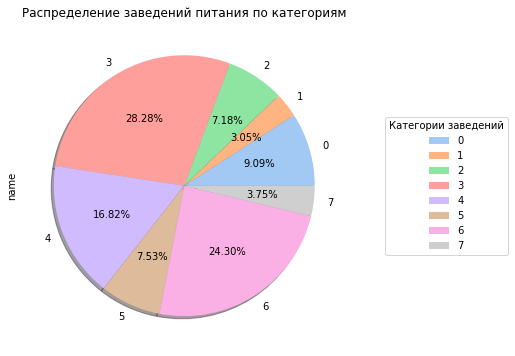

In [33]:
df_category.plot(y='name', kind = 'pie', figsize =(6,6), autopct='%1.2f%%',shadow=True)
plt.title('Распределение заведений питания по категориям')
plt.legend(title="Категории заведений", loc="center left", bbox_to_anchor=(1.1, 0, 0.5, 1))
plt.show()

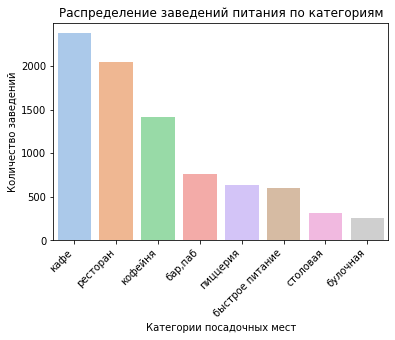

In [34]:
sns.barplot(x='category', y='name', data=df_category.sort_values('name', ascending = False) )
plt.title('Распределение заведений питания по категориям')
plt.xlabel('Категории посадочных мест')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, 
           ha='right')
plt.show()


На диаграмме видно, что наибольшее количество типов заведений общественного питания - кафе, далее - ресторан, кофейня и т.д. Кафе - это очень вместительная категория, обычно кафе - заведение из невысокого ценового сегмента, которое может быть и кофейней и пиццерией и столовой и быстрым питанием одновременно. 

### Исследуем количество посадочных мест в местах по категориям
<a id="3.2"></a> 

In [35]:
df_category_seats = df.groupby(by='category', as_index=False).agg(min=('seats', 'min'),max=('seats', 'max'),mean=('seats', 'mean'),median=('seats', 'median'))

In [36]:
df_category_seats

,category,min,max,mean,median
0,"бар,паб",0.00,"1,288.00",124.48,82.00
1,булочная,0.00,625.00,89.39,50.00
2,быстрое питание,0.00,"1,040.00",98.89,65.00
3,кафе,0.00,"1,288.00",97.37,60.00
4,кофейня,0.00,"1,288.00",111.20,80.00
5,пиццерия,0.00,"1,288.00",94.50,55.00
6,ресторан,0.00,"1,288.00",121.89,86.00
7,столовая,0.00,"1,200.00",99.75,75.50


Разделим заведения на категории по количеству посадочных мест, исходя из полученной таблицы о минимальных и максимальных значениях посадочных мест. 
Выделим категории
0 - заведения без посадочных мест
1-30 - заведения маленького размера
31-80 - заведения среднего размера
81-110 - заведения большого размера
111+ - очень большие заведения

In [37]:
def categorize_seats(seats):
    try:
        if  seats == 0:
            return '0'
        elif 1 <= seats <= 30:
            return '1-30'
        elif 31 <= seats <= 80:
            return '31-80'
        elif 81 <= seats <= 110:
            return '81-110'
        elif seats >= 111:
            return '111+'
    except:
        pass

In [38]:
df['seats_category'] = df['seats'].apply(categorize_seats)
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,seats_category
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False,None
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица дыбенко,False,1-30
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,клязьминская улица,False,31-80
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False,None
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False,111+
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.67,37.55,4.40,NaN,NaN,NaN,NaN,0,86.00,профсоюзная улица,False,81-110
8402,миславнес,кафе,"москва, пролетарскии проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.64,37.66,4.80,NaN,NaN,NaN,NaN,0,150.00,пролетарскии проспект,False,111+
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,3.90,NaN,Средний счёт:от 150 ₽,150.00,NaN,0,150.00,люблинская улица,True,111+
8404,чаихана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,4.20,NaN,NaN,NaN,NaN,1,150.00,люблинская улица,True,111+


Сгруппируем данные по двум категориям и построим график количества посадочных мест по категориям заведений

In [39]:
data = df.groupby(['category', 'seats_category'], as_index=False).agg(count=('category', 'count')).sort_values('count', ascending=False)

In [40]:
data 

,category,seats_category,count
18,кафе,31-80,474
33,ресторан,31-80,463
32,ресторан,111+,445
17,кафе,111+,312
22,кофейня,111+,248
23,кофейня,31-80,233
16,кафе,1-30,227
34,ресторан,81-110,216
3,"бар,паб",31-80,186
19,кафе,81-110,160


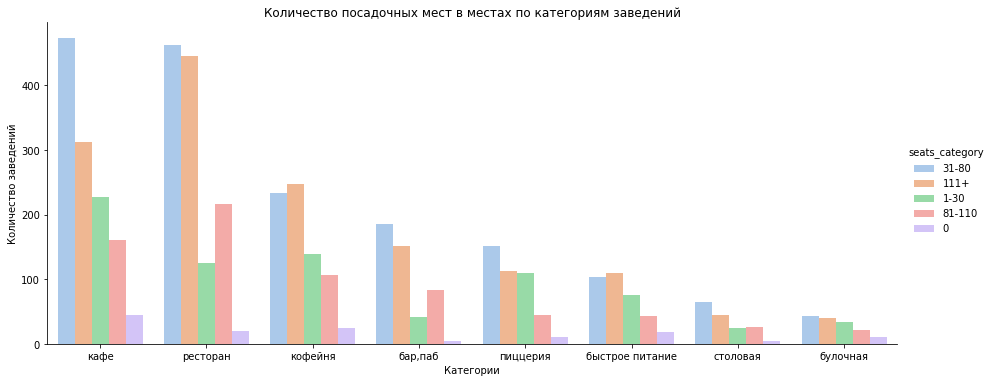

In [41]:
sns.catplot(x='category', y='count', hue='seats_category', data=data, kind='bar',height=5,aspect=2.5 )
plt.title('Количество посадочных мест в местах по категориям заведений')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
plt.show()
plt.show()

На графике мы видим, что в каждой категории заведения присутсвуют все пять категории посадочных мест. В основном преобладают заведения, которые мы отности к средней группе 31-80 мест. Далее идут очень большие заведения 111+, маленькие 1-30, просто большие 81-110 и удивительно, но в каждой категории есть заведения без посадочных мест, скорее всего тут кроется какая-то ошибка, не верится, что есть, например, столовые без посадочных мест.
посмотрим не изменится ли картина, если не учитывать категории заведений.

In [42]:
data_with_out_category = df.groupby('seats_category', as_index=False).agg(count=('seats_category', 'count')).sort_values('count', ascending=False)

In [43]:
data_with_out_category

,seats_category,count
3,31-80,1717
2,111+,1462
1,1-30,776
4,81-110,701
0,0,136


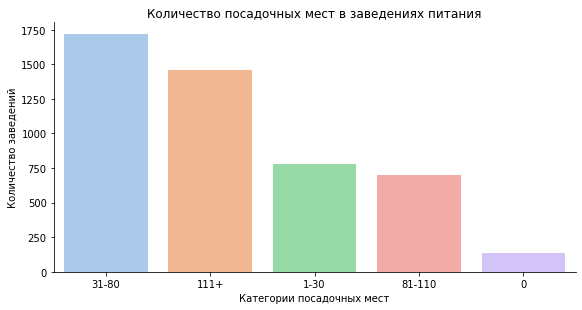

In [44]:
sns.catplot(x='seats_category', y='count', data=data_with_out_category, kind='bar',height=4,aspect=2 )
plt.title('Количество посадочных мест в заведениях питания')
plt.xlabel('Категории посадочных мест')
plt.ylabel('Количество заведений')
plt.show()

Ничего не изменилось, расстановка осталась прежней.

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Сначала посмотрим сколько у нас сетевых заведений.
<a id="3.3"></a> 

In [45]:
df_chain= df.groupby('chain')['chain'].sum()

In [46]:
df_chain

chain
0       0
1    3203
Name: chain, dtype: int64

Сетевых заведений получилось 3205, мы знаем, что пропусков в этом столбце нет, значить несетевых заведений 5201 (8406-3205=5201). построим график для наглядности результата.

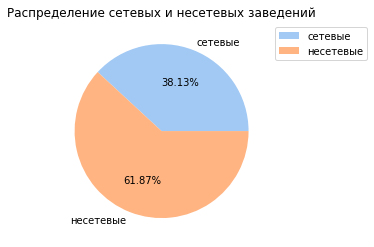

In [47]:
cnt = ['сетевые', 'несетевые']
values = ['3205', '5201']
fig1, ax1 = plt.subplots()
ax1.pie(values, labels=cnt,autopct='%1.2f%%' )
ax1.legend(loc='upper left', bbox_to_anchor=(1.0, 1.0))
plt.title('Распределение сетевых и несетевых заведений')
plt.show()

Получается сетевых заведений питания 38.13%, а несетевых соответственно 61,87%.

### Какие категории заведений чаще являются сетевыми? 
<a id="3.4"></a> 


Для ответа на этот вопрос сделаем таблицу, где будут данные по категориям - количество сетевых заведений, общее количество заведений и доля сетевых заведений.

In [48]:
chain_type = df.pivot_table(index = 'category', values='chain', aggfunc= ['sum', 'count']).reset_index() #count - общее количество заведений, sum - сетевые
chain_type.columns = ['_'.join(col).strip() for col in chain_type.columns.values] # избавились от мультииндексов
chain_type['rate'] = chain_type['sum_chain'] / chain_type['count_chain'] #нашли долю сетевых заведений от общего количества
chain_type = chain_type.sort_values(by='rate', ascending=False) #отсортировали по доле в порядке убывания
display(chain_type)

,category_,sum_chain,count_chain,rate
1,булочная,157,256,0.61
5,пиццерия,330,633,0.52
4,кофейня,720,1413,0.51
2,быстрое питание,232,603,0.38
6,ресторан,729,2042,0.36
3,кафе,779,2376,0.33
7,столовая,88,315,0.28
0,"бар,паб",168,764,0.22


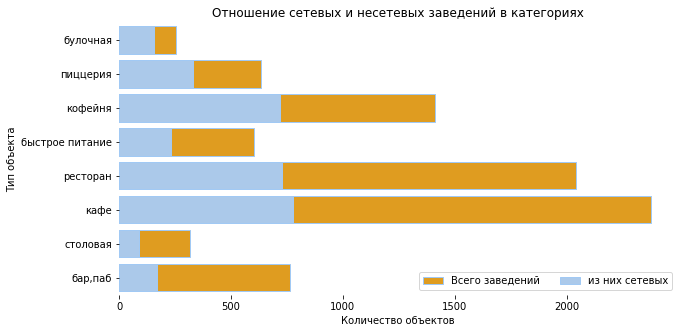

In [49]:
f, ax = plt.subplots(figsize = (10,5))
sns.set_color_codes('pastel')
sns.barplot(x = 'count_chain', y = 'category_', data = chain_type,
            label = 'Всего заведений', color = 'orange', edgecolor = 'b')
sns.set_color_codes('pastel')
sns.barplot(x = 'sum_chain', y = 'category_', data = chain_type,
            label = 'из них сетевых', color = 'b', edgecolor = 'b')
ax.legend(ncol = 2, loc = 'lower right')
ax.set(ylabel="Тип объекта", xlabel="Количество объектов")
sns.despine(left = True, bottom = True)
plt.title('Отношение сетевых и несетевых заведений в категориях')
plt.show()

На графике 'Отношение сетевых и несетевых заведений в категориях' мы видим, что больше всего доля сетевых заведений у категории - булочная, далее идет пиццерия, кофейня и т.д.

###  Найдем топ-15 популярных сетей в Москве.
<a id="3.5"></a> 

Для этого сначала сгруппируем данные по названиям заведений, затем постоим график

In [50]:
chain_top_15 = df.query('chain == 1').groupby('name').agg({'rating': 'median', 'category': pd.Series.mode , 'district' : 'count','seats' : 'mean'})
chain_top_15 = chain_top_15.rename(columns={'district':'count'})
chain_top_15 = chain_top_15.sort_values('count' , ascending = False).reset_index().head(15)
chain_top_15

,name,rating,category,count,seats
0,шоколадница,4.20,кофейня,120,135.14
1,домино'с пицца,4.20,пиццерия,76,52.82
2,додо пицца,4.30,пиццерия,74,94.60
3,one price coffee,4.20,кофейня,71,140.71
4,яндекс лавка,4.00,ресторан,69,119.00
5,cofix,4.10,кофейня,65,105.75
6,prime,4.20,ресторан,50,126.52
7,хинкальная,4.40,кафе,44,80.56
8,кофепорт,4.20,кофейня,42,121.48
9,кулинарная лавка братьев караваевых,4.40,кафе,39,102.07


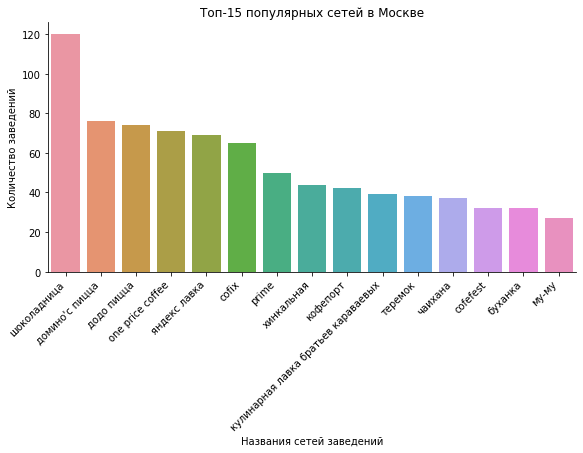

In [51]:
sns.catplot(x='name', y='count', data=chain_top_15, kind='bar',height=4,aspect=2 )
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Названия сетей заведений')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45, 
           ha='right')
plt.show()

График показывает, что самая популярная сеть в Москве - кофейня Шоколадница, далее Доминос пицца, Додо пицца и замыкает топ кафе Му-му. 

Посмотрим какие категории заведений питания лидируют в топ-15 сетей питания. Для этого сгруппируем chain_top_15 по категориям и отсортирует по убыванию

In [52]:
chain_top_15_category = chain_top_15.groupby('category')['count'].sum().sort_values(ascending = False)

In [53]:
chain_top_15_category

category
кофейня     330
ресторан    157
пиццерия    150
кафе        147
булочная     32
Name: count, dtype: int64

Получается по категориям топ-15 лидируют кофейни, далее с приличным отрывом в два раза идут, почти наравне, рестораны, пиццерии и кафе, замыкают список булочные. Сети заведений в топ-15 объединяет высокий рейтинг, более 4 баллов и. согласно нашему разделению на категории по количеству посадочных мест, топ-15 сетей состоит из заведений большого размера.

### Ответим на вопрос - какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам.
<a id="3.6"></a> 

In [54]:

df_district = df.groupby(['district', 'category']).agg({'rating': 'median', 'chain': 'count'}).sort_values('chain',ascending = False ).reset_index()
df_district = df_district.rename(columns={'chain': 'count_place'})
df_district.head(10)

,district,category,rating,count_place
0,Центральный административный округ,ресторан,4.40,670
1,Центральный административный округ,кафе,4.30,464
2,Центральный административный округ,кофейня,4.30,428
3,Центральный административный округ,"бар,паб",4.50,364
4,Юго-Восточный административный округ,кафе,4.20,282
5,Восточный административный округ,кафе,4.20,272
6,Северо-Восточный административный округ,кафе,4.20,269
7,Южный административный округ,кафе,4.20,264
8,Западный административный округ,кафе,4.20,238
9,Юго-Западный административный округ,кафе,4.20,238


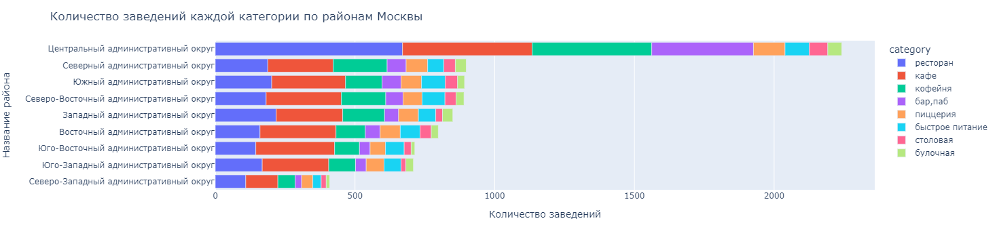

In [55]:
fig = px.bar(df_district,x='count_place', y='district',color='category')
fig.update_layout(
title = 'Количество заведений каждой категории по районам Москвы',
xaxis_title = 'Количество заведений',
yaxis_title = 'Название района',
yaxis={'categoryorder': 'total ascending'}
)
#fig.update_traces(marker_color='green'
fig.show()

Наибольшее количество заведение в ЦАО, по категориям в этом округе преобладают рестораны, далее идут - кафе, кофейни. бары. Менее презентабельные категории заведений в центре Москвы не так распростанены. В остальных администативных округах значительно меньше заведений и в них на первое место по категориям выходит кафе, затем ресторан, кофейня и т.д. Самое маленькое количество заведений в СЗАО, там их меньше 500, что примерно в 5 раз меньше, чем в ЦАО.

### Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
<a id="3.7"></a> 

Для этого сначала сгруппируем данные по категориям и посчитаем средний рейтинг в категориях, затем постоим график

In [56]:
df_rating = df.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()

In [57]:
df_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


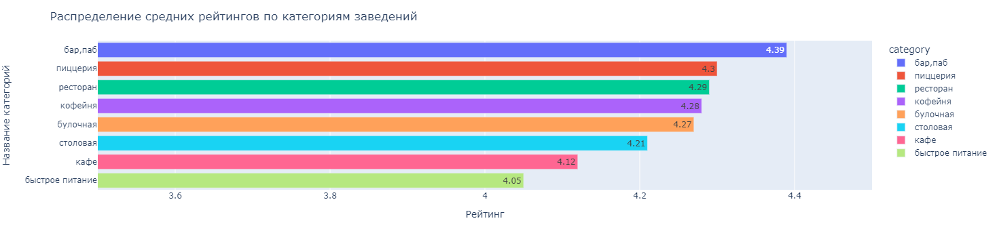

In [58]:
fig = px.bar(df_rating,x='rating',y='category',text='rating',color='category')
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',xaxis_title='Рейтинг',yaxis_title='Название категорий')
fig.update_xaxes(range=[3.5, 4.5])
fig.show()

Средние рейтинги заведений общественного питания Москвы показывают высокие результаты - от 4,39 до 4,05. Наиболее высокий средний рейтинг получили бары и пабы - 4,39, далее идут пиццерии , рестораны, кофейни и булочные с рейтингами 4,3 - 4,27. Самый низкий рейтинг у заведений быстрого питания, но низким его называть не правильно, все-таки он довольно высокий. 

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 
<a id="3.8"></a> 

Сначала создадим таблицу со средним рейтингои для каждого района

In [59]:
rating_df = df.groupby('district')['rating'].agg('mean')
rating_df

district
Восточный административный округ          4.17
Западный административный округ           4.18
Северный административный округ           4.24
Северо-Восточный административный округ   4.15
Северо-Западный административный округ    4.21
Центральный административный округ        4.38
Юго-Восточный административный округ      4.10
Юго-Западный административный округ       4.17
Южный административный округ              4.18
Name: rating, dtype: float64

In [60]:
#pip install geopandas

Сделаем хороплет

In [61]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы

state_geo = 'C:/Users/fedos/practicum/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
<a id="3.9"></a> 

In [62]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. 
<a id="3.10"></a> 

In [63]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,seats_category
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False,None
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00,улица дыбенко,False,1-30
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00,клязьминская улица,False,31-80
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False,None
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00,правобережная улица,False,111+


Сначала сгруппируем данные по названию улиц и посчитаем количесва заведений и выведем топ 15 улиц по количеству заведений

In [64]:
df_street_top = df.groupby('street').agg({'name': 'count'}).sort_values('name', ascending=False).reset_index().head(15)
df_street_top

,street,name
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинскии проспект,107
4,ленинградскии проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


Теперь создадим таблицу с количеством заведений и их категориями 

In [65]:
df_count_category = df.groupby(['street', 'category']).agg({'name': 'count'}).sort_values('name', ascending=False).reset_index()
df_count_category

,street,category,name
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
3816,молодогвардеиская улица,пиццерия,1
3817,монтажная улица,кофейня,1
3818,монтажная улица,ресторан,1
3819,москворецкая набережная,кофейня,1


Далее выберем только улицы из топ-15 и построем график распределения количества заведений и их категорий по этим улицам. 

In [66]:
df_count_category_top = df_count_category[df_count_category['street'].isin(df_street_top['street'])]
df_count_category_top.head(10)


,street,category,name
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
5,ленинскии проспект,ресторан,33
6,проспект вернадского,ресторан,33
7,ленинградское шоссе,ресторан,26
8,люблинская улица,кафе,26
9,ленинскии проспект,кафе,26


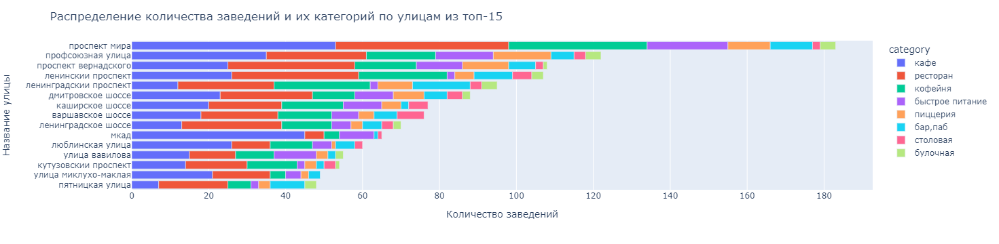

In [67]:
fig = px.bar(df_count_category_top,x='name', y='street',color='category')
fig.update_layout(
title = 'Распределение количества заведений и их категорий по улицам из топ-15',
xaxis_title = 'Количество заведений',
yaxis_title = 'Название улицы',
yaxis={'categoryorder': 'total ascending'}
)
fig.show()

Улица с самым большим количеством заведений общественного питание - проспект Мира, там находится 184 заведения, большинство из них кафе и рестораны, меньше всего столовых и булочных. Из замеченных особенностей - на МКАДе нет ни одной пиццерии и булочной, на улице Миклухо-Маклая нет столовой и булочной, на Пятницкой нет столовой, на Люблинской, Каширском и Варшавском шоссе не хватает булочных.


### Найдем улицы, на которых находится только один объект общепита.
<a id="3.11"></a> 

In [68]:
df_one = df['street'].value_counts().reset_index() # выведем количество заведение на улицах
df_one_rest = df_one.query('count == 1')#отфильтруем таблицу, оставим улицы только с одним заведением
df_one_rest.head(10)


,street,count
990,талдомская улица,1
991,улица фотиевои,1
992,2-и верхнии михаиловскии проезд,1
993,3-и михалковскии переулок,1
994,малая тульская улица,1
995,2-и рощинскии проезд,1
996,парк дружбы,1
997,улица губкина,1
998,воробьевская набережная,1
999,андреевскии пешеходныи мост,1


Посмотрим где на карте Моквы находятся эти заведения, для этого нам нужен адрес, а не просто улица, выберем данные только по улицам с одним заведением питания и покажем их на карте.

In [69]:
df_one_rest_adress = df[df['street'].isin(df_one_rest['street'])]
df_one_rest_adress.head(5)


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,seats_category
15,дом обеда,столовая,"москва, улица бусиновская горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.89,37.49,4.10,средние,Средний счёт:300–500 ₽,400.00,NaN,0,180.00,улица бусиновская горка,False,111+
21,7/12,кафе,"москва, прибрежныи проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.46,4.50,NaN,NaN,NaN,NaN,0,NaN,прибрежныи проезд,False,None
25,в парке вкуснее,кофейня,"москва, парк левобережныи",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк левобережныи,False,None
58,coffeekaldi's,кофейня,"москва, угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,Средний счёт:500–800 ₽,650.00,NaN,1,NaN,угличская улица,False,None
60,чебуречная история,кофейня,"москва, ландшафтныи заказник лианозовскии",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.57,4.90,NaN,NaN,NaN,NaN,1,NaN,ландшафтныи заказник лианозовскии,False,None


Посмотрим, где на карте располагаются такие заведения питания

In [70]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['category']} {row['address']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_one_rest_adress.apply(create_clusters, axis=1)

# выводим карту
m

Так же посмотрим к каким категориям относятся заведения на таких улицах

In [71]:
df_one_rest_adress_category = df_one_rest_adress.groupby('category')['street'].count().sort_values(ascending=False)
df_one_rest_adress_category

category
кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

В Москве 458 улиц, на которых находится всего одно заведение питания. Если внимательно изучить распределение таких заведений на карте, можно сказать, что большинство этих улиц - маленькие улочки и переулки в центре Москвы. Чем дальше от центра города, тем меньше таких улиц, но сами улицы уже в основном не такие маленькие, могут встречаться и довольно-таки большие. Больше всего таких заведений относятся к категории - кафе (160 заведений), далее идут рестораны (93 заедения) и совсем рядом кофейня (84 заведения), замыкает список - булочная (8 заведений).

### Посчитаем медиану примерной стоимости заказа для каждого района.Будем использовать это значение в качестве ценового индикатора района и построим фоновую картограмму (хороплет) с полученными значениями для каждого района.
<a id="3.12"></a> 

In [72]:
bill_median = df.groupby('district')['middle_avg_bill'].median().reset_index() #сгруппируем данные по округам и посчитаем медиану средней цены заказа 
bill_median.sort_values('middle_avg_bill', ascending=False) #отсортируем по убыванию

,district,middle_avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


Построим фоновую картограмму

In [73]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_median,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Медианная стоимость заказа в заведении',
).add_to(m)

# выводим карту
m

Самый высокий средний чек в заведениях общественного питания Москвы в ЦАО и в ЗАО. Это можно объяснить тем, что центр Москвы несомненно является местом притяжения и скопления туристов, да и жителей Москвы, там много заведений и цены самые высокие, спрос рождает предложение). ЗАО хоть и не самый центр, однако, на мой взгляд тут влияют такие факторы как близость международно аэропорта "Внуково". Так же тут располагается инновационный центр «Сколково», это территория, застроенная жилыми домами, учебными центрами, с развитой инфраструктурой, зоной отдыха, досуга и развлечений. СЗАО и САО находятся в направлении второго межународного аэропорта "Шереметьево", в эти округах средний чек в заведениях общественного питания ниже, составляет 700-650 рублей. Ну и самые низкие показатели у ЮВАО, ЮАО, СВАО. На самом деле как показывает практика других стран, регионы, примыкающие к городу с запада становятся наиболее перспективным для освоения , западные части мегаполисов чаще являются более развитыми, из этого следует и ценообразование на услуги в этих районах.

## Вывод
<a id="conclusion"></a> 
Мы провели исследование рынка заведений общественного питания Москвы. И вот, что мы получили в результате:
1. Наибольшее количество типов заведений общественного питания - кафе, далее идет ресторан, кофейня, бар, паб, пиццерия, быстрое питание, столовая и булочная. Кафе - это очень вместительная категория, обычно кафе - заведение из невысокого ценового сегмента, которое может быть и кофейней и пиццерией и столовой и быстрым питанием одновременно, видимо поэтому эта категория более распространена.
2. Разделив показатель - количество посадочных мест на категории и проанализировав его, мы выяснили, что каждая категория заведений представлена во всем категориях посадочных мест от 0 до 110. В основном преобладают заведения, которые мы отнесли к средней группе 31-80 мест. Далее идут очень большие заведения 111+, маленькие 1-30, просто большие 81-110.
3. Выяснили, что сетевых заведений питания 38.13%, а несетевых соответственно 61,87%. Больше всего доля сетевых заведений у категории - булочная, далее идет пиццерия, кофейня и т.д.
4. Самой популярной сетью в Москве оказалась Шоколадница, далее идет Доминос пицца и замыкает топ кафе Му-му. По категориям топ-15 лидируют кофейни, далее с приличным отрывом в два раза идут, почти наравне, рестораны, пиццерии и кафе, замыкают список булочные. Сети заведений в топ-15 объединяет высокий рейтинг, более 4 баллов и топ-15 сетей состоит из заведений большого размера.
5. Наибольшее количество заведение в ЦАО, по категориям в этом округе преобладают рестораны, далее идут - кафе, кофейни. бары. Менее презентабельные категории заведений в центре Москвы не так распростанены. В остальных администативных округах значительно меньше заведений и в них на первое место по категориям выходит кафе, затем ресторан, кофейня и т.д. Самое маленькое количество заведений в СЗАО, там их меньше 500, что примерно в 5 раз меньше, чем в ЦАО.
6. Рейтинги заведений общественного питания Москвы показывают высокие средние результаты - от 4,39 до 4,05. Наиболее высокий средний рейтинг получили бары и пабы - 4,39, далее идут пиццерии , рестораны, кофейни и булочные с рейтингами 4,3 - 4,27. Самый низкий рейтинг у заведений быстрого питания, но низким его называть не правильно, все-таки он довольно высокий. 
7. Улица с самым большим количеством заведений общественного питание - проспект Мира, там находится 184 заведения, большинство из них кафе и рестораны, меньше всего столовых и булочных. 
8. Так же в Москве 458 улиц, на которых находиться только по одному заведею питания. Большинство из них на маленьких улочках центра, в основном это кафе, рестораны и кофейни.
9. Самый высокий средний чек в заведениях общественного питания Москвы в ЦАО и в ЗАО. Это можно объяснить тем, что центр Москвы несомненно является местом притяжения и скопления туристов, да и жителей Москвы, там много заведений и цены самые высокие, спрос рождает предложение). ЗАО хоть и не самый центр, однако, на мой взгляд тут влияют такие факторы как близость международно аэропорта "Внуково". Так же тут располагается инновационный центр «Сколково», это территория, застроенная жилыми домами, учебными центрами, с развитой инфраструктурой, зоной отдыха, досуга и развлечений. СЗАО и САО находятся в направлении второго межународного аэропорта "Шереметьево", в эти округах средний чек в заведениях общественного питания ниже, составляет 700-650 рублей.

## Детализируем исследование: открытие кофейни
<a id="detailing"></a> 

### Исследуем кофейни в датасете
<a id="5.1"></a> 

Для ответа на поставленные вопросы отфильтруем данные по значению категории - кофейня.

In [74]:
df_coffee =df[df['category'].isin(['кофейня'])]
df_coffee

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,seats_category
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN,улица маршала федоренко,False,None
25,в парке вкуснее,кофейня,"москва, парк левобережныи",Северный административный округ,"ежедневно, 10:00–21:00",55.88,37.46,4.30,NaN,NaN,NaN,NaN,1,NaN,парк левобережныи,False,None
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.89,37.51,4.00,NaN,NaN,NaN,NaN,1,46.00,коровинское шоссе,False,31-80
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.88,37.49,3.60,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко,False,None
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.88,37.48,3.80,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко,False,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.68,37.74,4.50,NaN,NaN,NaN,NaN,0,NaN,люблинская улица,False,None
8365,квадрат кофе,кофейня,"москва, волгоградскии проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.71,37.74,4.20,NaN,Цена чашки капучино:100–220 ₽,NaN,160.00,0,206.00,волгоградскии проспект,False,111+
8376,шоколад имбирь корица,кофейня,"москва, граивороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.72,37.74,4.10,NaN,NaN,NaN,NaN,0,NaN,граивороновская улица,False,None
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.72,37.72,4.70,NaN,Цена чашки капучино:80–120 ₽,NaN,100.00,0,NaN,новохохловская улица,False,None


Получается у нас 1413 кофейн. Посмотрим в каких районах их больше всего.

In [75]:
#df_coffee_address = df_coffee.groupby(['district', 'address'])['category'].count().reset_index()
df_coffee_address = df_coffee.groupby('district')['category'].count().reset_index()
df_coffee_address.sort_values('category',ascending=False)

,district,category
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Посмотрим на распределение кофейн на карте

In [76]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['address']} {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_coffee.apply(create_clusters, axis=1)

# выводим карту
m

Рассмотрев расположение кофейн Москвы на карте и проанализировав их количество по округам, могу предположить, что хорошим местом ля открытия крутой и доступной кофейни, как «Central Perk» будет ЗАО, а в частности ближайшие улицы с университетским кварталом, там много молодежи, да и туристы там частые гости. А количество кофейн не так высоко - 150. средний чек заведений в этом округе самый высокий, если новую кофейню сделать еще и более доступной, думаю инвесторов будет ждать аншлаг.

### Исследуем круглосуточные кофейни
<a id="5.2"></a> 

In [77]:
df_coffee_24 = df_coffee[df_coffee['is_24/7'].isin([True])].reset_index() #отфильтруем таблицу с кофейнями по столбцу круглосуточной работы
df_coffee_24.head(15)

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,seats_category
0,200,wild bean,кофейня,"москва, дмитровское шоссе, 107е",Северный административный округ,"ежедневно, круглосуточно",55.88,37.54,3.50,NaN,NaN,NaN,NaN,1,20.00,дмитровское шоссе,True,1-30
1,971,wild bean cafe,кофейня,"москва, ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.87,37.71,4.00,NaN,NaN,NaN,NaN,1,25.00,ярославское шоссе,True,1-30
2,1047,wild bean cafe,кофейня,"москва, ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.85,37.68,4.50,NaN,Цена чашки капучино:140–200 ₽,NaN,170.00,1,NaN,ярославское шоссе,True,None
3,1214,wild bean cafe,кофейня,"москва, мкад, 65-и километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.81,37.39,4.30,NaN,NaN,NaN,NaN,1,NaN,мкад,True,None
4,1291,шоколадница,кофейня,"москва, улица народного ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.79,37.49,4.20,средние,Средний счёт:650–850 ₽,750.00,NaN,1,200.00,улица народного ополчения,True,111+
5,1468,кофе хауз,кофейня,"москва, ленинградскии проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.81,37.52,4.00,NaN,Цена чашки капучино:235–335 ₽,NaN,285.00,1,NaN,ленинградскии проспект,True,None
6,1790,кофемания,кофейня,"москва, ленинградскии проспект, 37а, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.79,37.54,4.70,NaN,NaN,NaN,NaN,1,15.00,ленинградскии проспект,True,1-30
7,1825,you&coffee,кофейня,"москва, улица золоторожскии вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.80,37.58,4.20,NaN,NaN,NaN,NaN,1,NaN,улица золоторожскии вал,True,None
8,1883,кофемания,кофейня,"москва, лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.59,4.40,высокие,Средний счёт:2000 ₽,"2,000.00",NaN,1,140.00,лесная улица,True,111+
9,2030,cinnabon,кофейня,"москва, долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.78,37.60,4.20,NaN,NaN,NaN,NaN,1,230.00,долгоруковская улица,True,111+


Круглосуточных кофейн 59 из 1413, не так много. посмотрим где такие кофейни расположены.

In [78]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['address']} {row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_coffee_24.apply(create_clusters, axis=1)

# выводим карту
m

Большинство круглосуточных кофейн в ЦАО и ЮЗАО Москвы (34 из 59), в других округах их очень мало.

### Исследуем рейтинг кофейн
<a id="5.3"></a> 

In [79]:
df_coffee_rating = df_coffee.groupby('district')['rating'].mean().reset_index() #сгруппируем таблицу с кофейнями по округу и найдем средний рейтинг
df_coffee_rating.sort_values('rating', ascending=False)

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Создадим фоновую картограмму (хороплет)

In [80]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие рейтинги у кофейн в ЦАО и в СЗАО, а вот в ЗАО средний рейтинг самый низкий из рассмотренных, классная кофейня тут не помешает!

### Исследуем среднюю стоимость чашки капучино в кофейнях
<a id="5.4"></a> 

Посмотрим на рапределение стоимости чашки капучино в наших кофейнях. 

In [81]:
df_coffee_bill = df_coffee.groupby('district')['middle_coffee_cup'].mean().reset_index() #сгруппируем таблицу с кофейнями по округу и найдем средний рейтинг
df_coffee_bill.sort_values('middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Самая высокая стоимость чашки кофе в ЗАО, там меньше всего кофейн, самый низкий средний рейтинг, но самые высокие цены...Возможно это нам и нужно. Это дает возможность привлечь больше посетителей, при условии, что цены в новом заведении не обязательно делать низкими, достаточно их сделать ниже самых высоких в Москве) 

In [82]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_coffee_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино',
).add_to(m)

# выводим карту
m

### Рекомендации
<a id="5.5"></a> 
На основе аналиизы кофейн Москвы могу дать следующие рекомендаци по открытию современной молодежной кофейни:
Местом для открытия кофейни рекомендую выбрать ЗАО, в частности район, близкий к МГУ, возможно пр. Вернадского или близлежащие улицы, режим работы установить круглосуточно, средний чек сильно не завышать, сделать его чуть выше среднего, так как:
1. Кофейн в данном округе не так много - 150
2. Круглосуточных кофейн всего одна-две
3. Рейтинг кофейн в ЗАО невысок, по сравнению с другими округами, поэтому новое классное заведение способно привлечь на себя внимание посетителей
4. Рядом с предложенным местом находятся такие общественные объекты как: Парк 50-летия Октября, Воронцовский парк, Парк олимпийской деревни, СК Олимпийский, а так же большая территория МГУ.

Ссылка на презентацию (новая версия)
https://disk.yandex.ru/i/8otWpwEDMVJF1w